In [319]:
import pandas as pd
import numpy as np

import datetime as dt

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.utils import resample

import statsmodels.api as sm
import scipy.stats as stats

import pickle


import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

    
from src.scrapers import scrape_huskies, scrape_seahawks
from src.data_retrievers import DataRetrieval
from src.holiday_calendars import SeattleHolidays
from src.featurizers import (CountCalls, FeaturizeCalls, DateDummies, HolidayDummies, 
                             EventDummies, MakeDummies, JoinDataFrames)

import matplotlib.pyplot as plt
%matplotlib inline

In [371]:
from sklearn.ensemble import (GradientBoostingRegressor, 
                              GradientBoostingClassifier, 
                              AdaBoostClassifier,
                              RandomForestClassifier)
from sklearn.svm import SVC
import sklearn.datasets as datasets
import sklearn.cross_validation as cv
from sklearn.ensemble.partial_dependence import partial_dependence, plot_partial_dependence
from mpl_toolkits.mplot3d import Axes3D

plt.style.use('ggplot')

from pylab import rcParams
rcParams['figure.figsize'] = (8.0, 6.0)

from IPython.display import HTML

/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [5]:
import pandas as pd
import numpy as np

from sklearn.pipeline import Pipeline

calls_pipe = Pipeline(steps=[
    ('counter', CountCalls(how='neighborhood')),
    ('feturizer', FeaturizeCalls()),
    ('date_dummifier', DateDummies())
])

In [6]:
retriever = DataRetrieval()

In [7]:
calls = retriever.get_calls_data()

In [8]:
data = calls_pipe.fit(calls)

In [9]:
calls_w_features = data.transform(calls)

In [147]:
calls_w_features

,date,neighborhood,num_calls,dt_time,day_seq,year,month,day,day_of_week,month_day,...,spec_day_11/15,spec_day_11/16,spec_day_11/23,spec_day_11/27,spec_day_12/04,spec_day_12/12,spec_day_12/19,spec_day_12/21,spec_day_12/23,spec_day_12/29
0,2010-01-01,ALASKA JUNCTION,1.0,2010-01-01,0,2010,01/01,1,4,01/01,...,0,0,0,0,0,0,0,0,0,0
1,2010-01-02,ALKI,0.0,2010-01-02,1,2010,01/02,2,5,01/02,...,0,0,0,0,0,0,0,0,0,0
2,2010-01-03,BALLARD NORTH,1.0,2010-01-03,2,2010,01/03,3,6,01/03,...,0,0,0,0,0,0,0,0,0,0
3,2010-01-04,BALLARD SOUTH,0.0,2010-01-04,3,2010,01/04,4,0,01/04,...,0,0,0,0,0,0,0,0,0,0
4,2010-01-05,BELLTOWN,0.0,2010-01-05,4,2010,01/05,5,1,01/05,...,0,0,0,0,0,0,0,0,0,0
5,2010-01-06,BITTERLAKE,1.0,2010-01-06,5,2010,01/06,6,2,01/06,...,0,0,0,0,0,0,0,0,0,0
6,2010-01-07,BRIGHTON/DUNLAP,1.0,2010-01-07,6,2010,01/07,7,3,01/07,...,0,0,0,0,0,0,0,0,0,0
7,2010-01-08,CAPITOL HILL,1.0,2010-01-08,7,2010,01/08,8,4,01/08,...,0,0,0,0,0,0,0,0,0,0
8,2010-01-09,CENTRAL AREA/SQUIRE PARK,0.0,2010-01-09,8,2010,01/09,9,5,01/09,...,0,0,0,0,0,0,0,0,0,0
9,2010-01-10,CHINATOWN/INTERNATIONAL DISTRICT,0.0,2010-01-10,9,2010,01/10,10,6,01/10,...,0,0,0,0,0,0,0,0,0,0


In [10]:
weather = retriever.get_weather_data()

In [11]:
seahawks_schedule = retriever.get_seahawks_schedule()

/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['date'][i] = (f"{df.iloc[i]['Date']}, {df.iloc[i]['year']}")
/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['seahawks_game'][i] = 'home_Regular'
/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/

In [12]:
huskies_schedule = retriever.get_huskies_schedule()

/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['huskies_game'][i] = 'away'
/Users/analyticallycorrect/galvanize/capstone/seattle_domestic_violence/src/data_retrievers.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df['huskies_game'][i] = 'home'


In [13]:
sounders_schedule = retriever.get_sounders_schedule()

In [14]:
sports = MakeDummies()

In [15]:
sports.fit(seahawks_schedule)

In [16]:
seahawks = sports.transform()

In [17]:
sports.fit(huskies_schedule)

In [18]:
huskies = sports.transform()

In [19]:
sports.fit(sounders_schedule)

In [20]:
sounders = sports.transform()

In [21]:
us_holiday_dict = SeattleHolidays.CustomHolidays()

In [22]:
us_holiday_dict._populate()

In [23]:
holidayier = HolidayDummies()

In [24]:
holidayier.fit(us_holiday_dict)

In [25]:
us_holidays = holidayier.transform()

In [26]:
jewish_holiday_dict = SeattleHolidays.JewishHolidays()

In [27]:
jewish_holiday_dict._populate()

In [28]:
holidayier.fit(jewish_holiday_dict)

In [29]:
jewish_holidays = holidayier.transform()

In [30]:
islamic_holiday_dict = SeattleHolidays.IslamicHolidays()

In [31]:
islamic_holiday_dict._populate()

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/site-packages/calendra/core.py:760: UserWarning: Please take note that, due to arbitrary decisions, this Islamic calendar computation may be wrong.
  warnings.warn('Please take note that, due to arbitrary decisions, '
/anaconda3/lib/python3.6/sit

In [32]:
holidayier.fit(islamic_holiday_dict)

In [33]:
islamic_holidays = holidayier.transform()

In [37]:
event_dummies = EventDummies()

In [38]:
event_dummies.fit()

In [39]:
events = event_dummies.transform()

In [40]:
joiner = JoinDataFrames(weather, us_holidays, islamic_holidays, jewish_holidays,
                        events, seahawks, huskies, sounders)

In [41]:
joiner.fit(calls_w_features)

In [42]:
calls_neighborhood = joiner.transform()

# Baseline Modle

In [93]:
b_targets = calls_neighborhood.pivot_table(values='num_calls',index='date', columns='neighborhood')

In [94]:
b_features = calls_neighborhood['day_seq'].drop_duplicates()

In [95]:
X_train_b, X_test_b, y_train_b, y_test_b =  train_test_split(b_features, b_targets,
                                                                 test_size=0.2, random_state=157)

X_train_b = np.array(X_train_b).reshape(-1, 1)
X_test_b = np.array(X_test_b).reshape(-1, 1)

In [96]:
neighborhood_model_b = LinearRegression()

In [97]:
neighborhood_model_b.fit(X_train_b, y_train_b)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [98]:
neighborhood_b_train_predictions = neighborhood_model_b.predict(X_train_b)
neighborhood_b_train_mse = mean_squared_error(y_train_b, neighborhood_b_train_predictions)

neighborhood_b_test_predictions = neighborhood_model_b.predict(X_test_b)
neighborhood_b_test_mse = mean_squared_error(y_test_b, neighborhood_b_test_predictions)

In [99]:
neighborhood_b_train_mse, neighborhood_b_test_mse

(0.5616549646134867, 0.5672616233277288)

In [100]:
neighborhood_model_b.score(X_train_b, y_train_b)

0.004964196467862284

In [50]:
calls_neighborhood.columns[5:43]

Index(['year', 'month', 'day', 'day_of_week', 'month_day', 'month_weekday',
       'spec_day', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6',
       'day_7', 'day_8', 'day_9', 'day_10', 'day_11', 'day_12', 'day_13',
       'day_14', 'day_15', 'day_16', 'day_17', 'day_18', 'day_19', 'day_20',
       'day_21', 'day_22', 'day_23', 'day_24', 'day_25', 'day_26', 'day_27',
       'day_28', 'day_29', 'day_30', 'day_31'],
      dtype='object')

# Random Forest Simplified


In [139]:
targets = calls_neighborhood.pivot_table(values='num_calls',index='date', columns='neighborhood')

features_cols = list(calls_neighborhood.columns[12:127])
features_cols.insert(0, 'day_seq')

features = calls_neighborhood[features_cols].drop_duplicates()

In [140]:
features_cols

['day_seq',
 'day_1',
 'day_2',
 'day_3',
 'day_4',
 'day_5',
 'day_6',
 'day_7',
 'day_8',
 'day_9',
 'day_10',
 'day_11',
 'day_12',
 'day_13',
 'day_14',
 'day_15',
 'day_16',
 'day_17',
 'day_18',
 'day_19',
 'day_20',
 'day_21',
 'day_22',
 'day_23',
 'day_24',
 'day_25',
 'day_26',
 'day_27',
 'day_28',
 'day_29',
 'day_30',
 'day_31',
 'month_weekday_Apr_Fri',
 'month_weekday_Apr_Mon',
 'month_weekday_Apr_Sat',
 'month_weekday_Apr_Sun',
 'month_weekday_Apr_Thu',
 'month_weekday_Apr_Tue',
 'month_weekday_Apr_Wed',
 'month_weekday_Aug_Fri',
 'month_weekday_Aug_Mon',
 'month_weekday_Aug_Sat',
 'month_weekday_Aug_Sun',
 'month_weekday_Aug_Thu',
 'month_weekday_Aug_Tue',
 'month_weekday_Aug_Wed',
 'month_weekday_Dec_Fri',
 'month_weekday_Dec_Mon',
 'month_weekday_Dec_Sat',
 'month_weekday_Dec_Sun',
 'month_weekday_Dec_Thu',
 'month_weekday_Dec_Tue',
 'month_weekday_Dec_Wed',
 'month_weekday_Feb_Fri',
 'month_weekday_Feb_Mon',
 'month_weekday_Feb_Sat',
 'month_weekday_Feb_Sun',
 'mont

In [141]:
X_train, X_test, y_train, y_test =  train_test_split(features, targets,
                                                     test_size=0.2, random_state=157)


In [142]:
rf = RandomForestRegressor(n_estimators=5000, max_features='auto', random_state=157, n_jobs=-1)

In [143]:
rf.fit(X_train, y_train)
# ~3 minutes for 10k
# ~10 minutes for 20k
                                     
# Test Prediction
train_pred = rf.predict(X_train)
test_pred = rf.predict(X_test)

In [144]:
mean_squared_error(y_train, train_pred), mean_squared_error(y_test, test_pred)

(0.08176362588048067, 0.6058852219474286)

In [145]:
rf.score(X_train, y_train), rf.score(X_test, y_test)

(0.8551464149637261, -0.06680640382574962)

# Random Forest


In [194]:
targets = calls_neighborhood.pivot_table(values='num_calls',index='date', columns='neighborhood')

features = calls_neighborhood.drop(columns=['neighborhood', 'date', 'num_calls', 'dt_time','year', 
                                                    'month', 'day','day_of_week', 'month_day','month_weekday',
                                                    'spec_day']).drop_duplicates()

In [295]:
X_train, X_test, y_train, y_test =  train_test_split(features, targets,
                                                     test_size=0.2, random_state=157)


In [304]:
rf = RandomForestRegressor(n_estimators=10000, max_features='auto', random_state=157, n_jobs=-1)

In [305]:
rf.fit(X_train, y_train)
# ~3 minutes for 10k
# ~10 minutes for 20k
                                     
# Test Prediction
train_pred = rf.predict(X_train)
test_pred = rf.predict(X_test)

In [306]:
mean_squared_error(y_train, train_pred), mean_squared_error(y_test, test_pred)

(0.07892312178151772, 0.5844465827216784)

In [307]:
rf.score(X_train, y_train), rf.score(X_test, y_test)

(0.860178691818063, -0.02905853213838842)

In [49]:
import os.path

file_path = "rf1.pkl"
n_bytes = 2**31
max_bytes = 2**31 - 1
data = bytearray(n_bytes)

## write
bytes_out = pickle.dumps(rf)
with open(file_path, 'wb') as f_out:
    for idx in range(0, len(bytes_out), max_bytes):
        f_out.write(bytes_out[idx:idx+max_bytes])

In [203]:
rf_city = RandomForestRegressor(n_estimators=10000, max_features='auto', random_state=157, n_jobs=-1)

In [204]:
 rf_city.fit(X_train, y_train.sum(axis=1))

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10000, n_jobs=-1,
           oob_score=False, random_state=157, verbose=0, warm_start=False)

In [205]:
train_pred_city = rf_city.predict(X_train)
test_pred_city = rf_city.predict(X_test)

mean_squared_error(y_train.sum(axis=1), train_pred_city), mean_squared_error(y_test.sum(axis=1), test_pred_city)

(5.040598607883411, 36.90957163688576)

In [206]:
y_train.sum(axis=1).mean(), np.sqrt(mean_squared_error(y_test.sum(axis=1), test_pred_city))

(30.102503912363066, 6.075324817397483)

In [207]:
rf_city.score(X_train, y_train.sum(axis=1)), rf_city.score(X_test, y_test.sum(axis=1))

(0.8795021306097589, 0.06695108307653952)

In [208]:
np.mean(np.array(y_train)), np.sqrt(mean_squared_error(y_test, test_pred))

(0.5102119307180181, 0.778386293524898)

In [263]:
neighborhood_dist_train = pd.DataFrame(np.array(y_train.T) / np.array(y_train.sum(axis=1))).T
neighborhood_dist_test = pd.DataFrame(np.array(y_test.T) / np.array(y_test.sum(axis=1))).T

In [249]:
rf_dist = RandomForestRegressor(n_estimators=5000, max_features='auto', random_state=157, n_jobs=-1)

In [265]:
rf_dist.fit(X_train, neighborhood_dist_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=5000, n_jobs=-1,
           oob_score=False, random_state=157, verbose=0, warm_start=False)

In [271]:
train_pred_dist = rf_dist.predict(X_train)
test_pred_dist = rf_dist.predict(X_test)

mean_squared_error(neighborhood_dist_train, train_pred_dist), mean_squared_error(neighborhood_dist_test, test_pred_dist)

(8.904109288427514e-05, 0.0006596607952942548)

In [276]:
np.sqrt(0.00065966)

0.025683847063864867

In [275]:
rf_dist.score(X_train, neighborhood_dist_train), rf_dist.score(X_test, neighborhood_dist_test)

(0.8587596759517816, -0.04066013616426118)

In [285]:
train_pred_comb = train_pred_city * neighborhood_dist_train.T
test_pred_comb = test_pred_city * neighborhood_dist_test.T


In [290]:

mean_squared_error(y_train, train_pred_comb.T), mean_squared_error(y_test, test_pred_comb.T)

(0.005543797252282832, 0.040403060819437286)

In [313]:
rf.score(X_train, train_pred_comb.T), rf.score(X_test, test_pred_comb.T)

(0.8576654650472892, -0.026676280418639623)

In [312]:
X_train.shape, train_pred_comb.shape

((2556, 277), (59, 2556))

In [303]:
X_train.columns

Index(['day_seq', 'day_1', 'day_2', 'day_3', 'day_4', 'day_5', 'day_6',
       'day_7', 'day_8', 'day_9',
       ...
       'local_event_Womens March', 'seahawks_game_SuperBowl',
       'seahawks_game_away_Playoffs', 'seahawks_game_away_Regular',
       'seahawks_game_home_Playoffs', 'seahawks_game_home_Regular',
       'huskies_game_away', 'huskies_game_home', 'sounders_game_away',
       'sounders_game_home'],
      dtype='object', length=277)

In [315]:
graph_pred_comb = rf_city.predict(features)

In [336]:
graph_act = calls_neighborhood.pivot_table(values='num_calls',index='date', columns='neighborhood').sum(axis=1)


In [338]:
graph_act.index

Index([2010-01-01, 2010-01-02, 2010-01-03, 2010-01-04, 2010-01-05, 2010-01-06,
       2010-01-07, 2010-01-08, 2010-01-09, 2010-01-10,
       ...
       2018-09-21, 2018-09-22, 2018-09-23, 2018-09-24, 2018-09-25, 2018-09-26,
       2018-09-27, 2018-09-28, 2018-09-29, 2018-09-30],
      dtype='object', name='date', length=3195)

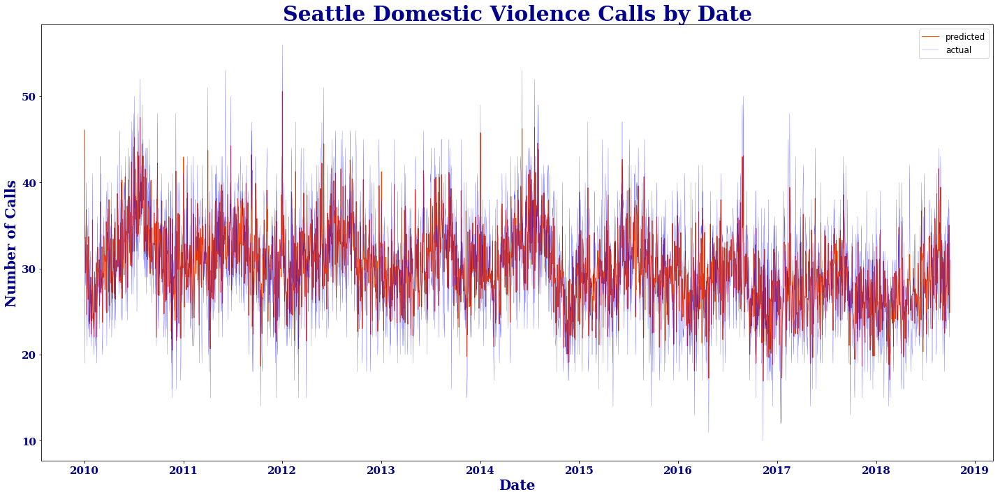

In [340]:
fig, axs = plt.subplots(1, figsize=(20,10))

axs.plot(graph_act.index, graph_pred_comb, lw=1, color='orangered')
axs.plot(graph_act.index, graph_act, lw=0.2, color='blue')
axs.set_title('Seattle Domestic Violence Calls by Date', fontdict={'family': 'serif','color':  'darkblue','weight': 'bold','size': 30,})
axs.set_ylabel('Number of Calls', fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 20,})
axs.set_yticklabels(list(range(0, 70, 10)), fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 15,})
axs.set_xticklabels(list(range(2010, 2020)), fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 15,})
axs.legend(['predicted', 'actual'], fontsize = 'large')
axs.set_xlabel('Date', fontdict={'family': 'serif','color':  'darkblue','weight': 'semibold','size': 20,})
fig.tight_layout()

In [363]:
# Plot the feature importance for city level rf
feat_scores_city = pd.DataFrame({'Fraction of Samples Affected' : rf_city.feature_importances_},
                           index=X_train.columns)
feat_scores_city = feat_scores.sort_values(by='Fraction of Samples Affected')

In [366]:
feat_scores_city.plot(kind='barh', figsize=(20,500), fontsize=20)

In [354]:
feat_scores

,Fraction of Samples Affected
holiday_Rosh Hashana 5781,0.000000
"holiday_Third day of Chinese Lunar New Year, Valentines Day",0.000000
holiday_Rosh Hashana 5777,0.000000
holiday_Rosh Hashana 5780,0.000000
holiday_Rosh Hashana 5782,0.000000
holiday_Rosh Hashana 5783,0.000000
holiday_Rosh Hashana 5784,0.000000
holiday_Rosh Hashana 5785,0.000000
"holiday_Second day of Chinese Lunar New Year, Valentines Day",0.000000
holiday_Rosh Hashana 5786,0.000000


In [369]:
# Plot the feature importance for city level rf
feat_scores_dist = pd.DataFrame({'Fraction of Samples Affected' : rf_dist.feature_importances_},
                           index=X_train.columns)
feat_scores_dist = feat_scores_dist.sort_values(by='Fraction of Samples Affected')

In [370]:
feat_scores_dist.plot(kind='barh', figsize=(20,500), fontsize=20)

# Gradient Boosting


(-10, 2000)

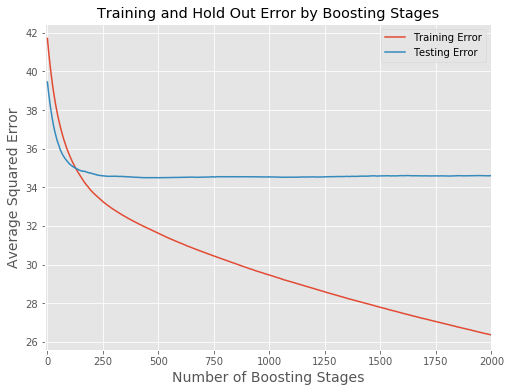

In [462]:
N_ESTIMATORS = 2000

model = GradientBoostingRegressor(n_estimators=N_ESTIMATORS, learning_rate=0.01)
model.fit(X_train, y_train.sum(axis=1))

train_score = np.zeros(N_ESTIMATORS)
for i, y_pred in enumerate(model.staged_predict(X_train)):
    train_score[i] = model.loss_(y_train.sum(axis=1), y_pred)

test_score = np.zeros(N_ESTIMATORS)
for i, y_pred in enumerate(model.staged_predict(X_test)):
    test_score[i] = model.loss_(y_test.sum(axis=1), y_pred)
    
plt.plot(np.arange(N_ESTIMATORS) + 1, train_score,
        label="Training Error")
plt.plot(np.arange(N_ESTIMATORS) + 1, test_score,
        label="Testing Error")
plt.title("Training and Hold Out Error by Boosting Stages")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)
plt.legend(loc="upper right")
plt.xlim([-10, 2000])

#plt.savefig('plots/training-and-testing-error.png', bbox_inches='tight')

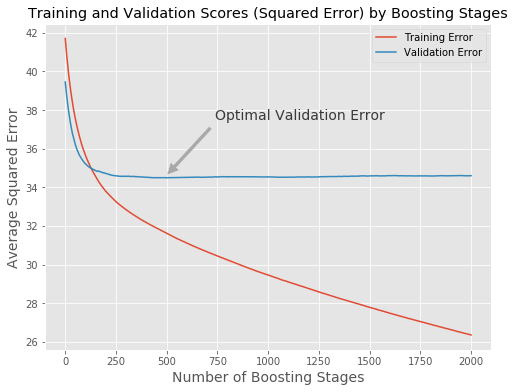

In [463]:
# Estimating the optimal number of boosters using a validation set

optimal_n_trees = np.argmin(test_score)
optimal_score = test_score[optimal_n_trees]

plt.plot(np.arange(N_ESTIMATORS) + 1, train_score,
        label="Training Error")
plt.plot(np.arange(N_ESTIMATORS) + 1, test_score,
        label="Validation Error")

optimal_point = (optimal_n_trees, optimal_score)
plt.annotate('Optimal Validation Error', optimal_point,
              xytext=(optimal_point[0] + 250, optimal_point[1] + 3),
              arrowprops=dict(facecolor="darkgrey", shrink=0.05),
              fontsize=14,
              alpha=0.75
            )

plt.title("Training and Validation Scores (Squared Error) by Boosting Stages")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)
plt.legend(loc="upper right")

#plt.savefig('plots/training-and-testing-error-with-optima.png', bbox_inches='tight')

In [464]:
optimal_n_trees

489

In [465]:
# Fit a model with optimal values to look at various diagnostic plots

model_city = GradientBoostingRegressor(n_estimators=optimal_n_trees, learning_rate=0.01)
model_city.fit(X_train, y_train.sum(axis=1))

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.01, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=489, presort='auto', random_state=None,
             subsample=1.0, verbose=0, warm_start=False)

In [466]:
np.sum(model_city.feature_importances_)

1.0000000000000004

In [467]:
feat_scores_boost_c = pd.DataFrame({'Fraction of Samples Affected' : model_city.feature_importances_},
                           index=X_train.columns)
feat_scores_boost_c = feat_scores_dist.sort_values(by='Fraction of Samples Affected')

In [468]:
feat_scores_boost_c.plot(kind='barh', figsize=(20,500), fontsize=20)

In [469]:
model_city.score(X_train, y_train.sum(axis=1)), model_city.score(X_test, y_test.sum(axis=1))

(0.24258250977826212, 0.1281365269314393)

In [470]:
mean_squared_error(y_train.sum(axis=1), model_city.predict(X_train)), mean_squared_error(y_test.sum(axis=1), model_city.predict(X_test))

(31.683859358823142, 34.48919636809122)

# Tuning


In [498]:
y_train.sum(axis=1)[list(train_idxs)]

date
2010-05-01    30.0
2015-05-24    35.0
2015-09-25    32.0
2013-11-30    32.0
2015-08-02    38.0
2016-06-24    29.0
2014-07-11    28.0
2015-08-20    38.0
2013-04-10    29.0
2013-02-22    28.0
2011-10-02    30.0
2016-09-02    23.0
2010-01-14    23.0
2011-10-07    34.0
2017-10-09    24.0
2018-03-26    40.0
2011-01-03    29.0
2017-10-05    35.0
2011-04-12    25.0
2010-07-21    35.0
2016-04-25    21.0
2014-05-19    43.0
2013-01-01    38.0
2018-02-08    24.0
2011-03-21    36.0
2013-02-05    22.0
2013-10-31    27.0
2013-11-08    24.0
2013-03-30    41.0
2015-07-07    34.0
              ... 
2010-03-25    31.0
2010-08-01    49.0
2010-11-18    30.0
2010-09-29    23.0
2010-05-18    26.0
2015-11-10    36.0
2011-01-25    35.0
2015-06-06    40.0
2013-05-24    32.0
2015-12-02    31.0
2013-02-27    21.0
2018-04-02    23.0
2011-04-05    35.0
2012-10-31    28.0
2015-10-26    30.0
2012-05-03    37.0
2014-10-14    24.0
2017-03-12    34.0
2012-12-10    26.0
2016-01-19    22.0
2012-07-13    33.0
2013-03

In [522]:
# Tuning by cross validation
N_ESTIMATORS = 1500
N_FOLDS = 10

train_scores = np.zeros((N_FOLDS, N_ESTIMATORS))
test_scores = np.zeros((N_FOLDS, N_ESTIMATORS))

for k, (train_idxs, test_idxs) in enumerate(cv.KFold(n=len(X_train), n_folds=N_FOLDS,
                                            shuffle=True, random_state=1)):
    X_train_tune, y_train_tune = X_train.iloc[list(train_idxs)], y_train.sum(axis=1)[list(train_idxs)]
    X_test_tune, y_test_tune = X_train.iloc[list(test_idxs)], y_train.sum(axis=1)[list(test_idxs)]
    model = GradientBoostingRegressor(n_estimators=N_ESTIMATORS, learning_rate=0.01)
    model.fit(X_train_tune, y_train_tune)
    
    for i, y_pred in enumerate(model.staged_predict(X_train_tune)):
        train_scores[k, i] = model.loss_(y_train_tune, y_pred)
    for i, y_pred in enumerate(model.staged_predict(X_test_tune)):
        test_scores[k, i] = model.loss_(y_test_tune, y_pred)

In [523]:
mean_train_score = np.mean(train_scores, axis=0)
mean_test_score = np.mean(test_scores, axis=0)

optimal_n_trees = np.argmin(mean_test_score)
optimal_score = mean_test_score[optimal_n_trees]
optimal_point = (optimal_n_trees, optimal_score)

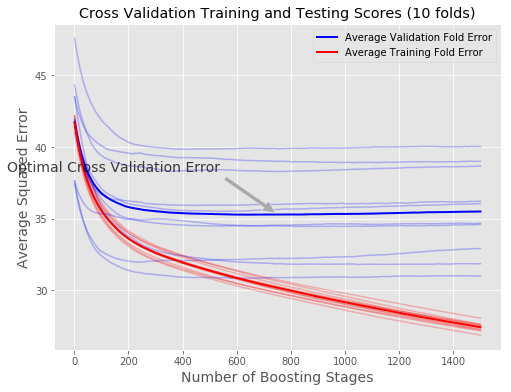

In [524]:
for i in range(N_FOLDS):
    plt.plot(np.arange(N_ESTIMATORS) + 1, train_scores[i, :], color='red', alpha=0.25)
    
for i in range(N_FOLDS):
    plt.plot(np.arange(N_ESTIMATORS) + 1, test_scores[i, :], color='blue', alpha=0.25)
    
plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_score, color='blue', linewidth=2,
         label='Average Validation Fold Error')
plt.plot(np.arange(N_ESTIMATORS) + 1, mean_train_score, color='red', linewidth=2,
         label='Average Training Fold Error')

plt.annotate('Optimal Cross Validation Error', optimal_point,
              xytext=(optimal_point[0] - 1000, optimal_point[1] + 3),
              arrowprops=dict(facecolor="darkgrey", shrink=0.05),
              fontsize=14,
              alpha=0.75
            )

plt.title("Cross Validation Training and Testing Scores (10 folds)")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)
plt.legend(loc="upper right")

#plt.savefig('plots/training-and-testing-cv-error.png', bbox_inches='tight')

In [525]:
optimal_point

(752, 35.27023189542223)

In [526]:
# Varying the learning rate
N_ESTIMATORS = 1500
N_FOLDS = 10

learning_rates = [0.025, 0.01]
N_LEARNING_RATES = len(learning_rates)

train_scores = np.zeros((N_FOLDS, N_LEARNING_RATES, N_ESTIMATORS))
test_scores = np.zeros((N_FOLDS, N_LEARNING_RATES, N_ESTIMATORS))

for k, (train_idxs, test_idxs) in enumerate(cv.KFold(n=len(X_train), n_folds=N_FOLDS,
                                            shuffle=True, random_state=1)):
    X_train_tune, y_train_tune = X_train.iloc[list(train_idxs)], y_train.sum(axis=1)[list(train_idxs)]
    X_test_tune, y_test_tune = X_train.iloc[list(test_idxs)], y_train.sum(axis=1)[list(test_idxs)]
    
    models = [GradientBoostingRegressor(n_estimators=N_ESTIMATORS,
                                        max_depth=3, learning_rate=lr, subsample=0.5,
                                        random_state=154) 
              for lr in learning_rates]
    for model in models:
        model.fit(X_train_tune, y_train_tune)
    
    for i, model in enumerate(models):
        for j, y_pred in enumerate(model.staged_predict(X_train_tune)):
            train_scores[k, i, j] = model.loss_(y_train_tune, y_pred)
        
    for i, model in enumerate(models):
        for j, y_pred in enumerate(model.staged_predict(X_test_tune)):
            test_scores[k, i, j] = model.loss_(y_test_tune, y_pred)

mean_train_scores = np.mean(train_scores, axis=0)
mean_test_scores = np.mean(test_scores, axis=0)
            


Text(0.5,0.98,'Effect of Varying the Learning Rate')

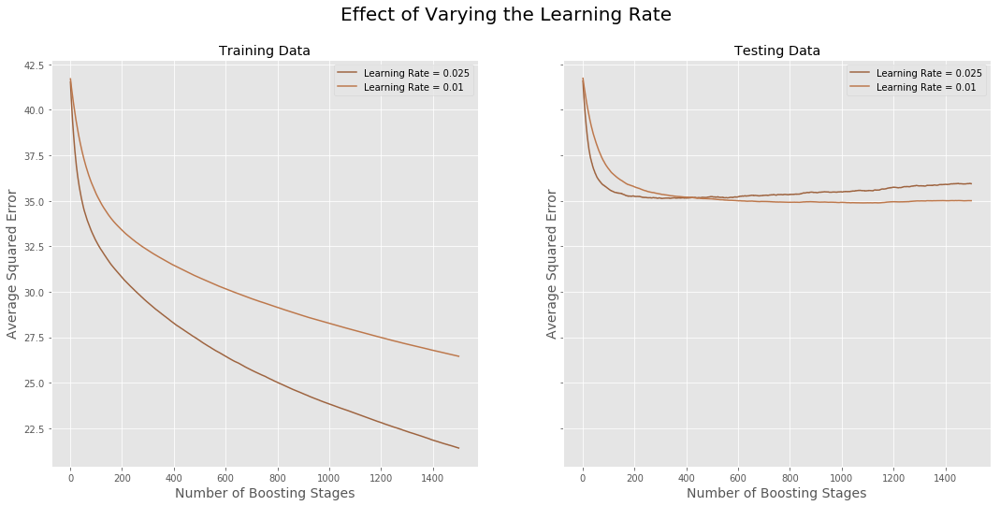

In [527]:
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True, 
                         figsize=(18.0, 8.0))
        
for i, rate in enumerate(learning_rates):        
    axes[0].plot(np.arange(N_ESTIMATORS) + 1, mean_train_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Learning Rate = " + str(rate))
axes[0].legend(loc="upper right")
axes[0].set_title("Training Data")
axes[0].set_xlabel('Number of Boosting Stages', fontsize=14)
axes[0].set_ylabel('Average Squared Error', fontsize=14)

for i, rate in enumerate(learning_rates):        
    axes[1].plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Learning Rate = " + str(rate))
axes[1].legend(loc="upper right")
axes[1].set_title("Testing Data")
axes[1].set_xlabel('Number of Boosting Stages', fontsize=14)
axes[1].set_ylabel('Average Squared Error', fontsize=14)

#plt.ylim([0, 20])
plt.suptitle("Effect of Varying the Learning Rate", fontsize=20)

#plt.savefig('plots/varying-learning-rate-error.png', bbox_inches='tight')

Text(0,0.5,'Average Squared Error')

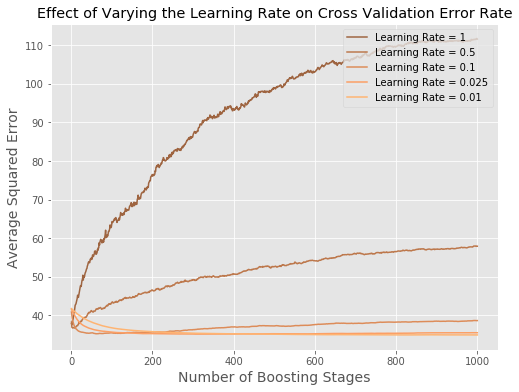

In [511]:
for i, rate in enumerate(learning_rates):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Learning Rate = " + str(rate))
plt.legend(loc="upper right")
plt.title("Effect of Varying the Learning Rate on Cross Validation Error Rate")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

#plt.ylim([0, 20])
#plt.savefig('plots/varying-learning-rate-error-testing.png', bbox_inches='tight')

Text(0,0.5,'Average Squared Error')

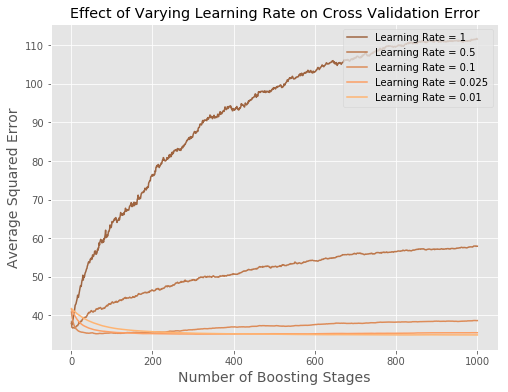

In [509]:
for i, rate in enumerate(learning_rates):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Learning Rate = " + str(rate))
plt.legend(loc="upper right")
plt.title("Effect of Varying Learning Rate on Cross Validation Error")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

#plt.xlim([0, 300])
#plt.savefig('plots/varying-learning-rate-error-testing-zoom-start.png', bbox_inches='tight')

(0, 300)

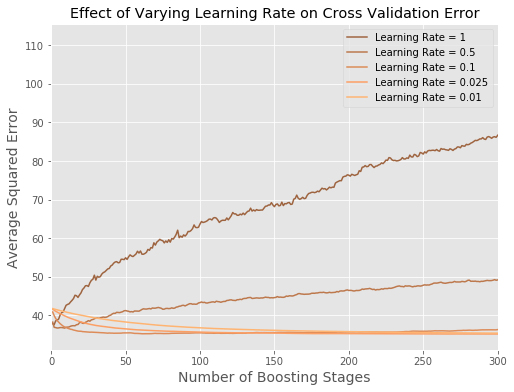

In [512]:
for i, rate in enumerate(learning_rates):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Learning Rate = " + str(rate))
plt.legend(loc="upper right")
plt.title("Effect of Varying Learning Rate on Cross Validation Error")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

plt.xlim([0, 300])
#plt.savefig('plots/varying-learning-rate-error-testing-zoom-start.png', bbox_inches='tight')

Text(0,0.5,'Average Squared Error')

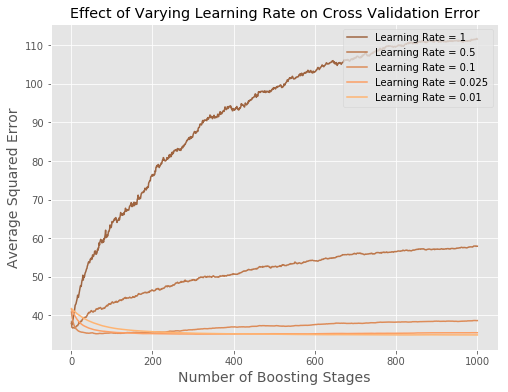

In [514]:
for i, rate in enumerate(learning_rates):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Learning Rate = " + str(rate))
plt.legend(loc="upper right")
plt.title("Effect of Varying Learning Rate on Cross Validation Error")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

#plt.xlim([3500, 4000])
#plt.ylim([8, 10])
#plt.savefig('plots/varying-learning-rate-error-testing-zoom-end.png', bbox_inches='tight')

In [528]:
# Varying the tree depth rate
N_ESTIMATORS = 1500
N_FOLDS = 10

tree_depths = [3, 5]
N_TREE_DEPTHS = len(tree_depths)

test_scores = np.zeros((N_FOLDS, N_TREE_DEPTHS, N_ESTIMATORS))

for k, (train_idxs, test_idxs) in enumerate(cv.KFold(n=len(X_train), n_folds=N_FOLDS,
                                            shuffle=True, random_state=1)):
    X_train_tune, y_train_tune = X_train.iloc[list(train_idxs)], y_train.sum(axis=1)[list(train_idxs)]
    X_test_tune, y_test_tune = X_train.iloc[list(test_idxs)], y_train.sum(axis=1)[list(test_idxs)]
    
    models = [GradientBoostingRegressor(n_estimators=N_ESTIMATORS,
                                        max_depth=td, learning_rate=0.01, subsample=0.5,
                                        random_state=154)
              for td in tree_depths]
    for model in models:
        model.fit(X_train_tune, y_train_tune)
        
    for i, model in enumerate(models):
        for j, y_pred in enumerate(model.staged_predict(X_test_tune)):
            test_scores[k, i, j] = model.loss_(y_test_tune, y_pred)
        
mean_test_scores = np.mean(test_scores, axis=0)

for i, depth in enumerate(tree_depths):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Tree Depth " + str(depth))
plt.legend(loc="upper right")
plt.title("Effect of Varying the Tree Depth on Cross Validation Error")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

plt.ylim([30, 80])
#plt.savefig('plots/varying-tree-depth-error.png', bbox_inches='tight')

KeyboardInterrupt: 

In [ ]:
for i, depth in enumerate(tree_depths):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Tree Depth = " + str(depth))
plt.legend(loc="upper right")
plt.title("Effect of Varying the Tree Depth on Cross Validation Error")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

plt.xlim([0, 1000])
plt.ylim([30, 45])
#plt.savefig('plots/varying-tree-depth-error-zoom.png', bbox_inches='tight')

Text(0,0.5,'Average Squared Error')

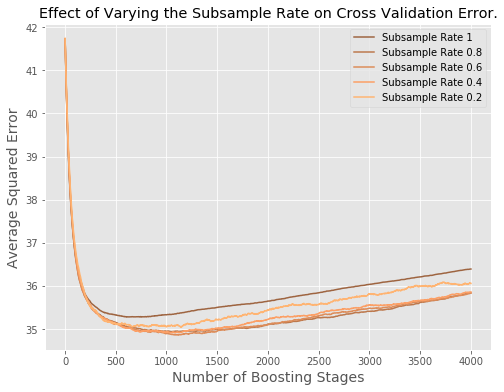

In [519]:
# Varying the subsample rate
N_ESTIMATORS = 4000
N_FOLDS = 10

subsample_rates = [1, 0.8, 0.6, 0.4, 0.2]
N_SUBSAMPLE_RATES = len(subsample_rates)

test_scores = np.zeros((N_FOLDS, N_SUBSAMPLE_RATES, N_ESTIMATORS))

for k, (train_idxs, test_idxs) in enumerate(cv.KFold(n=len(X_train), n_folds=N_FOLDS,
                                            shuffle=True, random_state=1)):
    X_train_tune, y_train_tune = X_train.iloc[list(train_idxs)], y_train.sum(axis=1)[list(train_idxs)]
    X_test_tune, y_test_tune = X_train.iloc[list(test_idxs)], y_train.sum(axis=1)[list(test_idxs)]

    models = [GradientBoostingRegressor(n_estimators=N_ESTIMATORS,
                                        max_depth=3, learning_rate=0.01, subsample=sr,
                                        random_state=154)
              for sr in subsample_rates]
    for model in models:
        model.fit(X_train_tune, y_train_tune)
        
    for i, model in enumerate(models):
        for j, y_pred in enumerate(model.staged_predict(X_test_tune)):
            test_scores[k, i, j] = model.loss_(y_test_tune, y_pred)
        
mean_test_scores = np.mean(test_scores, axis=0)

for i, rate in enumerate(subsample_rates):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Subsample Rate " + str(rate))
plt.legend(loc="upper right")
plt.title("Effect of Varying the Subsample Rate on Cross Validation Error.")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

#plt.ylim([0, 20])
#plt.savefig('plots/varying-subsample-rate-error.png', bbox_inches='tight')

Text(0,0.5,'Average Squared Error')

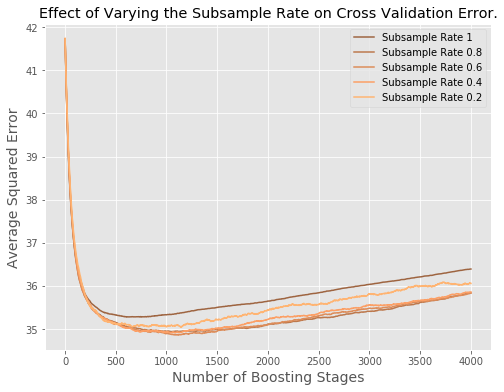

In [520]:
for i, rate in enumerate(subsample_rates):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Subsample Rate " + str(rate))
plt.legend(loc="upper right")
plt.title("Effect of Varying the Subsample Rate on Cross Validation Error.")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

#plt.ylim([0, 20])
#plt.xlim([0, 1000])
#plt.savefig('plots/varying-subsample-rate-error-zoom-start.png', bbox_inches='tight')

Text(0,0.5,'Average Squared Error')

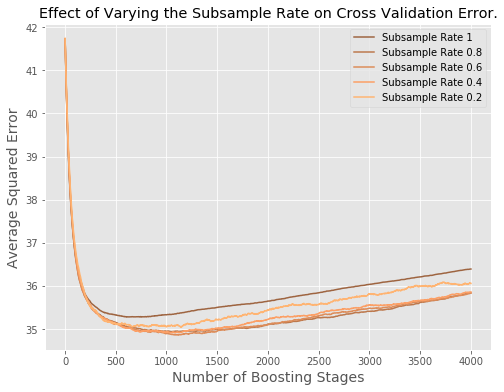

In [521]:
for i, rate in enumerate(subsample_rates):        
    plt.plot(np.arange(N_ESTIMATORS) + 1, mean_test_scores[i, :], 
                 color=plt.cm.copper(float(i) / 10 + 0.5),
                 label="Subsample Rate " + str(rate))
plt.legend(loc="upper right")
plt.title("Effect of Varying the Subsample Rate on Cross Validation Error.")
plt.xlabel('Number of Boosting Stages', fontsize=14)
plt.ylabel('Average Squared Error', fontsize=14)

#plt.ylim([8, 12])
#plt.xlim([3500, 4000])
#plt.savefig('plots/varying-subsample-rate-error-zoom-end.png', bbox_inches='tight')